# Linear Regression with Gradient Descent

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.cm as cm

from random import random
from sklearn.metrics import mean_squared_error, r2_score

## Data Loading and Visualization

Data from the [House Prices - Advanced Regression Techniques][1] Kaggle competiton.

[1]: https://www.kaggle.com/c/house-prices-advanced-regression-techniques/overview

In [2]:
data = pd.read_csv(
    'data/properties_prices.csv',
    usecols=['SalePrice','GrLivArea'])
data = data.sample(n=250, random_state=1)

In [3]:
X = data['GrLivArea']
Y = data['SalePrice']

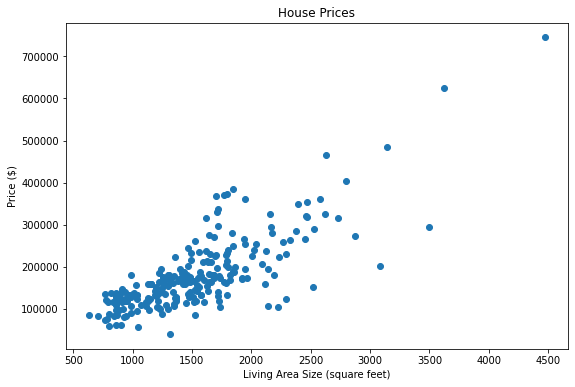

In [4]:
fig = plt.figure(figsize=(9,6))
plt.scatter(X, Y)
plt.title('House Prices')
plt.xlabel('Living Area Size (square feet)')
plt.ylabel('Price ($)')
plt.show()

## Linear Regression

In statistics, Linear Regression is a approach to modeling the relationship between a dependent variable ($y$) and one or more independent variables ($x$) by fitting a linear equation of the form $y = mx + b$ to the data where $m$ is the slope of the line, and $b$ is the intercept. 

In the case of Simple Linear Regression when there is a single dependent variable the coefficients, m and b, can be found by calculating statiscal properties such as means, standard deviations, etc. However, in real life problems we usually have to deal with multiple variables and thus finding the coefficients by just using statiscs is no longer practical.

## Cost Function

To find the unknown coefficients, we can use a Cost Function ($J$), which is a measure of how wrong the regression line fits the data. The Cost Function can be represented by an $error$ that it is defined as the difference between the observed value $y_{i}$ and the value predicted by the regression line ${y_{pred}}_{i}$:

$$
\begin{aligned}
error &= y_{i} - {y_{pred}}_{i} \\
 &= y_{i} - (mx_{i} + b)
\end{aligned}
$$

We'll use a method called Ordinary Least Squares as our Cost Function, this method estimates the coefficents, m and b, by minimizing the sum of the squared errors.

$$J = \frac{1}{n}\sum_{i = 0}^{n}(error_{i})^{2}$$

The following is the resulting Cost Function:

$$J(m,b) = \frac{1}{n}\sum_{i = 0}^{n}(y_{i} - (mx_{i} + b))^{2}$$

In [5]:
def calculate_cost(X, Y, m, b):
    n = len(Y)
    Y_pred = m * X + b
    error = Y - Y_pred
    
    # Cost function
    J = (1/n) * np.sum((error)**2)
    return J

## Gradient Descent

It's important to remember that our goal is precisely to minimize the cost function and to do so we'll use **Gradient Descent** an interative algorithm to find the mininum of a function.

$$\min_{(m,b)} J(m,b)$$

Gradient Descent is based on the observation that a function $F(x)$ decreases fastest if it goes from a point $a$ in the direction of the negative gradient at $a$, $-\nabla F(a)$. The gradient of a multi-variable function such as the cost function $J(m,b)$ can be calculated as follows:

$$
\nabla J(m,b) = \begin{bmatrix} 
\frac{\partial J}{\partial m}
\\ 
\frac{\partial J}{\partial b}
\end{bmatrix} = \begin{bmatrix}
\frac{1}{n}\sum_{i = 0}^{n}-2x_{i}(y_{i} - (mx_{i} + b))
\\ 
\frac{1}{n}\sum_{i = 0}^{n}-2(y_{i} - (mx_{i} + b))
\end{bmatrix}
$$

At every iteration the algorithm takes a small step in the opposite direction of the gradient by slightly updating the values of the coefficients:

$$
\begin{aligned}
m &{:=}  m -\gamma\frac{\partial}{\partial m}J(m,b) \\
b &{:=}  b -\gamma\frac{\partial}{\partial b}J(m,b)
\end{aligned}
$$

Here $\gamma$ is the **learning rate** which is basically the size of the step taken by the algorithm. If $\gamma$ is to small, Gradient Descent will converge slowly. Although, if $\gamma$ is too big Gradient Descent can overshoot the minimun and fail to converge.

In [6]:
def gradient_descent(X, Y, learning_rate, iter):
    # Inicialize slope(m) and intercept(b) with random numbers
    np.random.seed(10)
    m, b = np.random.rand(2)
    slopes, intercepts, costs = [], [], [] 
    for _ in range(iter):
        n = len(Y)
        Y_pred = m * X + b
        error = Y - Y_pred # Calculates the error
        
        # Calculate partial derivatives
        m_deriv = (-2/n) * np.sum(X * (error))
        b_deriv = (-2/n) * np.sum(error)
        
        # Update parameters values
        m -= m_deriv * learning_rate # Updating m
        b -= b_deriv * learning_rate # Updating b
        
        # Calculate the cost for the current iteration
        cost = calculate_cost(X, Y, m, b)
        
        # Store the values of the current iteration in the appropriate arrays
        slopes.append(m)
        intercepts.append(b)
        costs.append(cost)
    return slopes, intercepts, costs

## Visualizations

Below are some cool visualizations including 3d plots and animations.

In [7]:
def plot_cost_function(costs):
    fig = plt.figure(figsize=(7,5))
    plt.title('Cost Function (J)')
    plt.xlabel('Iterations')
    plt.ylabel('Cost')
    plt.plot(costs)
    plt.show()

In [8]:
def generate_animation(X, Y, slopes, intercepts, costs, frames,
                       output_file):  
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,6))
    
    # Scatter with the regression line fitted to data
    ax1.set_title('House Prices')
    ax1.set_xlabel('Living Area Size (square feet)')
    ax1.set_ylabel('Price ($)')
    ax1.scatter(X, Y, marker='.')
    line, = ax1.plot([], [], lw=1.5, color='red') # Regression line
    annotation = ax1.text(35, 4400000,'')
    annotation.set_animated(True)
    X_max = max(X)

    # Scatter plot of the cost function
    x, y = [], []
    colors = cm.rainbow(np.linspace(1, 0, 50))
    ax2.set_title('Cost Function')
    ax2.set_xlabel('Slope')
    ax2.set_ylabel('Cost')
    points = ax2.scatter(x, y)
    
    # Seting the limits of axes x and y to avoid cropping
    ax2.set_xlim(min(slopes) - 0.05*max(slopes), 1.05*max(slopes))
    ax2.set_ylim(min(costs) - 0.05*max(costs), 1.05*max(costs))

    plt.close()

    #Generate the animation data
    def init():
        line.set_data([], [])
        annotation.set_text('')

        points.set_offsets([])
        points.set_color([])

        return line, annotation, points,

    # Animation function that is called sequentially
    def animate(i):
        X = np.linspace(0, int(1.05*X_max), 10000)
        Y = slopes[i] * X + intercepts[i]
        line.set_data(X, Y)
        annotation.set_text(
            'f(x) = %0.2fx + %0.2f' % (slopes[i], intercepts[i])
        )

        x.append(slopes[i])
        y.append(costs[i])
        points.set_color(colors[:i + 1])
        points.set_offsets(np.c_[x,y])

        return line, annotation, points

    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=frames, interval=100,
                                   blit=True)

    anim.save(output_file, writer='imagemagick', fps = 5)

In [9]:
import os

def get_3d_plots(slopes, intercepts, file_path, learning_rate,
                          n=250):
    # custom range for better visualization
    x = np.linspace(10, 230, n) 
    y = np.linspace(0.95*min(intercepts), 1.05*max(intercepts), n)
    M, B = np.meshgrid(x, y)
    z = np.array([calculate_cost(X, Y, m, b) 
                   for m,b in zip(np.ravel(M), np.ravel(B))])
    J = z.reshape(M.shape)
    
    fig = plt.figure(figsize = (9,6))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(M, B, J, rstride = 5, cstride = 5,
                    cmap = 'jet', alpha=0.5)
    ax.plot(slopes, intercepts, costs, 'k', marker='.')
    
    # Check if folder exists
    folder = os.path.isdir(file_path)
    if not folder:
        os.makedirs(file_path)
    
    images = []
    for angle in range(0,360,2):
        ax.view_init(15, angle)
        plt.xlabel(r'$Slope$', fontsize=15)
        plt.ylabel(r'$Intercept$', fontsize=15)
        plt.title('Cost' , fontsize=20)
        plt.suptitle(('Learning Rate = %g' % learning_rate), 
                     y=0.875, fontsize=10)
        file_name = f'{file_path}3d_animation_step{angle}.png'
        plt.savefig(file_name, dpi=72)
        images.append(file_name)
    plt.close(fig)
    return images

In [10]:
from PIL import Image
import glob

def get_gif_from_png(file_name, images):
    # Create the frames
    frames = []
    for i in images:
        new_frame = Image.open(i)
        frames.append(new_frame)

    # Save into a GIF file that loops forever
    frames[0].save(file_name, format='GIF',
                   append_images=frames[1:],
                   save_all=True,
                   duration=100, loop=0)

In [11]:
import io
import base64
from IPython.display import HTML

def display_animation(file_name):
    video = io.open(file_name, 'r+b').read()
    encoded = base64.b64encode(video)
    html = HTML(
        data=
        f'''
        <img src="data:image/gif;base64,{encoded.decode('ascii')}" type="gif" />
        ''')
    return html

## Effects of the learning rate

To illustrate the effects of the learning rate on the convergence of a Gradient Descent Algorithm we will fit two regression lines to the data. In the first one, we will use a very small learning rate and in the second, a rate nine times higher.

### Low Learning Rate

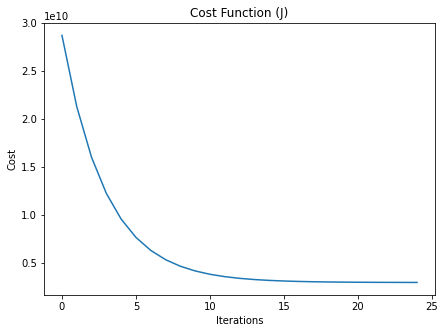

In [12]:
learning_rate = 3e-8
iterations = 25
slopes, intercepts, costs = gradient_descent(X, Y, learning_rate, iterations)
plot_cost_function(costs)

With a small learning rate we can observe that the cost function converges slowly.


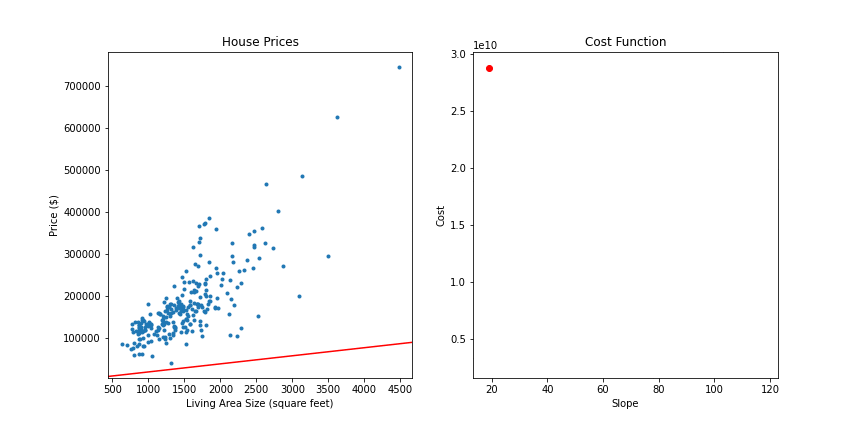

In [13]:
file_name = 'linear_regression_low_lr.gif'
generate_animation(X, Y, slopes, intercepts, costs, iterations, file_name)
display_animation(file_name)


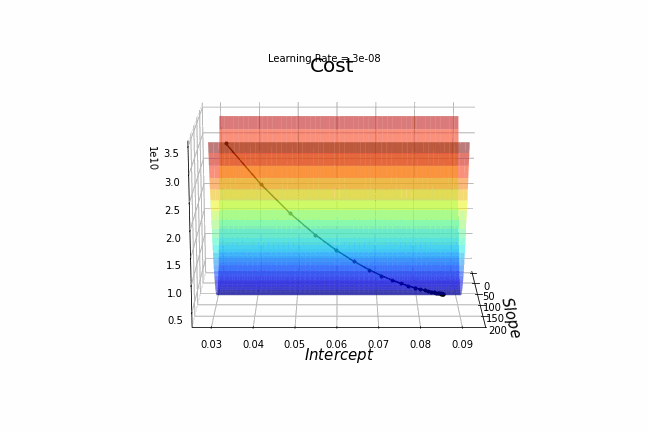

In [14]:
file_path = '3d_animation_low_lr/'
images = get_3d_plots(slopes, intercepts, file_path, learning_rate)
get_gif_from_png('3d_animation_low_lr.gif', images)
display_animation('3d_animation_low_lr.gif')

### High Learning Rate

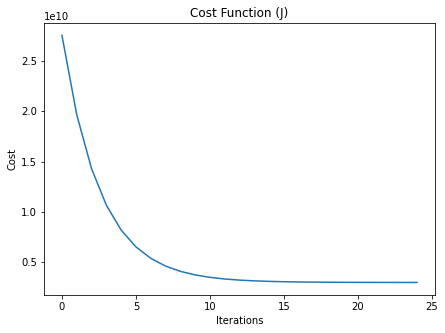

In [15]:
learning_rate = 3.5e-7
iterations = 25
slopes, intercepts, costs = gradient_descent(X, Y, learning_rate, iterations)
plot_cost_function(costs)

However, with a higher learning rate, the step is bigger and the algorithm overshoots the minimum multiple times until it converges.


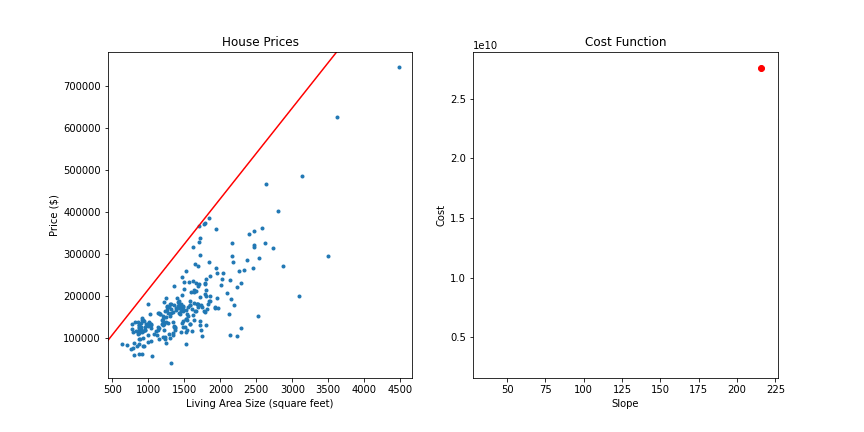

In [16]:
file_name = 'linear_regression_high_lr.gif'
generate_animation(X, Y, slopes, intercepts, costs, iterations, file_name)
display_animation(file_name)


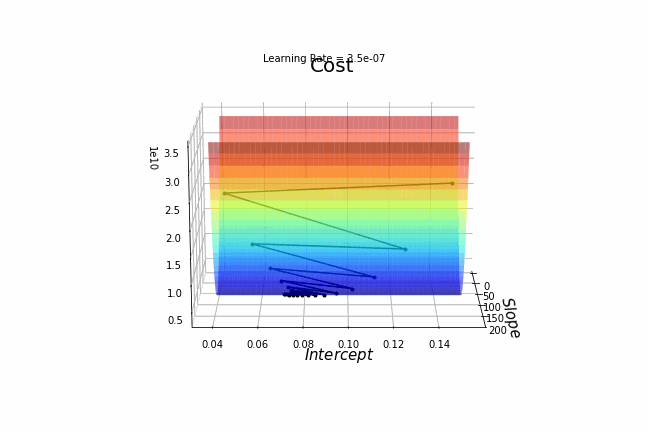

In [17]:
file_path = '3d_animation_high_lr/'
images = get_3d_plots(slopes, intercepts, file_path, learning_rate)
get_gif_from_png('3d_animation_high_lr.gif', images)
display_animation('3d_animation_high_lr.gif')